Dataset: (http://comexstat.mdic.gov.br/), which is basically the official data source for brazilian exports e imports, maintened by the government;
The dataset contains all trackings of monthly imports and exports of a range of products (soybeans, soybean meal, soybean oil, corn, wheat and sugar), by brazilian states, by routes (air, sea, ground, etc) e from/to which country;
We ask you to address a couple quentions below. Remember that data viz is one important skill to show besides any analytical skill. So we encourage you to use and explore a bunch of graphs and tables to show your point.


1. Show the evolution of total monthly and total annual exports from Brazil (all states and to everywhere) of ‘soybeans’, ‘soybean oil’ and ‘soybean meal’;
2. What are the 3 most important products exported by Brazil in the last 5 years?
3. What are the main routes through which Brazil have been exporting ‘corn’ in the last few years? Are there differences in the relative importancem of routes depending on the product?
4. Which countries have been the most important trade partners for Brazil in terms of ‘corn’ and ‘sugar’ in the last 3 years?
5. For each of the products in the dataset, show the 5 most important states in terms of exports?


6. Now, we ask you to show your modelling skills. Feel free to use any type of modelling approach, but bear in mind that the modelling approach depends on the nature of your data, and so different models yield different estimates and forecasts. To help you out in this task we also provide you with a dataset of possible covariates (.xlsx). They all come from public sources (IMF, World Bank) and are presented in index number format. Question: What should be the total brazilian soybeans, soybean_meal, and corn export forecasts, in tons, for the next 11 years (2020-2030)? We’re mostly interested in the annual forecast.

* WHOLE THING MONTH AND YEAR FOR SOY
* TOP 3 PRODUCTS EXPORTED LAST 5 YEARS
* MAIN ROUTES FOR CORN LAST YEARS
* TOP COUNTRIES EXPORTED CORN LAST 3 YEARS


* MODELING: ANY APPROACH, TABLE WITH COVARIANTS

#### FORECAST SOYBEANS, SOYBEANS_MEAT AND CORN EXPORTS IN TONS NEXT 11 YEARS ANUAL

<br><br>



In [1]:
import numpy as np # algebra linear
import pandas as pd ## data processing
import datetime # manipulating date formats

import matplotlib.pyplot as plt # basic plotting
import seaborn as sns # for prettier plots
import chart_studio
from chart_studio.plotly import plot_mpl

import plotly.graph_objects as go
import plotly.express as px




from statsmodels.tsa.seasonal import seasonal_decompose #decompose
import statsmodels.api as sm #stats


In [2]:
from pylab import rcParams

plt.style.use('fivethirtyeight')
rcParams['figure.figsize'] =15,7
rcParams['lines.linewidth'] = 2
plt.close('all')

# EDA

In [25]:
ls

CASE 1.ipynb        TFP.csv             covariates.xlsx
CASE 2.ipynb        covariates.csv      data_comexstat.csv


In [3]:
df = pd.read_csv('data_comexstat.csv' ,encoding = "ISO-8859-1",engine='python')

In [32]:
covar = pd.read_excel('covariates.xlsx')

In [33]:
covar.head()

,year,price_soybeans,price_corn,price_soybean_meal,gdp_china,gdp_iran,gpd_netherlands,gdp_spain,gdp_thailand,gdp_world,gdp_egypt,gdp_japan,gdp_vietnam
0,1979,NaN,NaN,NaN,100.000000,100.000000,NaN,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,1980,100.000000,100.000000,100.000000,107.900000,81.200000,100.000000,101.200000,104.600000,102.100000,103.400000,103.200000,96.500000
2,1981,98.525508,103.888308,99.805440,113.402900,74.216800,99.500000,100.795200,110.771400,104.039900,105.674800,107.534400,102.097000
3,1982,83.406192,85.986430,86.596956,123.609161,83.939201,98.206500,102.004742,116.753056,104.664139,113.389060,111.083035,110.468954
4,1983,97.851743,108.168059,98.663318,136.958950,95.522811,99.974217,103.738823,123.291227,107.594735,123.480687,114.970941,118.312250


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117965 entries, 0 to 117964
Data columns (total 8 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   date     117965 non-null  object 
 1   product  117965 non-null  object 
 2   state    117965 non-null  object 
 3   country  117965 non-null  object 
 4   type     117965 non-null  object 
 5   route    117965 non-null  object 
 6   tons     117965 non-null  float64
 7   usd      117965 non-null  float64
dtypes: float64(2), object(6)
memory usage: 7.2+ MB


In [5]:
df['date'] = pd.to_datetime(df['date'], yearfirst=True, format='%Y-%m-%d')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117965 entries, 0 to 117964
Data columns (total 8 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   date     117965 non-null  datetime64[ns]
 1   product  117965 non-null  object        
 2   state    117965 non-null  object        
 3   country  117965 non-null  object        
 4   type     117965 non-null  object        
 5   route    117965 non-null  object        
 6   tons     117965 non-null  float64       
 7   usd      117965 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 7.2+ MB


In [6]:
df.shape

(117965, 8)

In [7]:
df.columns

Index(['date', 'product', 'state', 'country', 'type', 'route', 'tons', 'usd'], dtype='object')

In [8]:
df.describe()

,tons,usd
count,1.179650e+05,1.179650e+05
mean,1.453681e+04,4.813150e+06
std,4.977926e+04,1.949412e+07
min,0.000000e+00,0.000000e+00
25%,1.249000e+02,7.155200e+04
50%,2.000000e+03,7.250000e+05
75%,1.353403e+04,3.895943e+06
max,1.798446e+06,9.039304e+08


In [9]:
df.isnull().sum()

date       0
product    0
state      0
country    0
type       0
route      0
tons       0
usd        0
dtype: int64

In [10]:
df.state.unique()

array(['ES', 'GO', 'MG', 'MS', 'PE', 'PR', 'RS', 'SC', 'SP', 'MT', 'RN',
       'BA', 'RJ', 'AL', 'CE', 'DF', 'PB', 'AM', 'PI', 'PA', 'MA', 'TO',
       'SE', 'RO', 'AP', 'RR', 'AC'], dtype=object)

In [12]:
df.type.unique()

array(['Import', 'Export'], dtype=object)

In [13]:
df['product'].unique()

array(['corn', 'soybean_meal', 'soybean_oil', 'soybeans', 'sugar',
       'wheat'], dtype=object)

In [14]:
df['country'].unique()

array(['United States', 'Argentina', 'Bolivia', 'Paraguay', 'Uruguay',
       'Netherlands', 'Ecuador', 'Germany', 'Hungary', 'Bermuda',
       'Cameroon', 'Denmark', 'France', 'Indonesia', 'Italy', 'Panama',
       'Philippines', 'Slovenia', 'United Kingdom', 'Chile', 'China',
       'Israel', 'Japan', 'Spain', 'Turkey', 'Bangladesh', 'Hong Kong',
       'India', 'Iran', 'Algeria', 'Gambia', 'Ghana', 'Libya', 'Senegal',
       'Sri Lanka', 'Yemen', 'Nigeria', 'United Arab Emirates', 'Jordan',
       'Russia', 'Tunisia', 'South Africa', 'Mexico', 'Taiwan', 'Morocco',
       'Singapore', 'Cuba', 'Angola', 'Jamaica', 'Peru', 'Colombia',
       'Poland', 'Australia', 'Thailand', 'Malaysia', 'Pakistan',
       'Cape Verde', 'Portugal', 'Norway', 'Uzbekistan', 'Belgium',
       'Cayman Islands', 'Croatia', 'Georgia', 'Greece', 'Ireland',
       'South Korea', 'Liechtenstein', 'Netherlands Antilles',
       'North Korea', 'Switzerland', 'Madagascar', 'Mauritius',
       'Venezuela', 'Egypt',

In [15]:
df['route'].unique()

array(['Sea', 'Ground', 'Air', 'Other', 'River'], dtype=object)

In [16]:
df.type.value_counts()

Export    105861
Import     12104
Name: type, dtype: int64

In [18]:
# filter soy stuff


exp = df[df['type']=='Export']  #filter only exports
pv = ['product'] #select feature pivot
y = ['soybean_meal', 'soybean_oil', 'soybeans'] #select attributes


#all products exports year
exports_t = exp.pivot_table(index=exp['date'].dt.year,columns=pv,values='tons',aggfunc='sum')

#Filter by attributes
exp_selec = exports_t[y]
exp_selec

product,soybean_meal,soybean_oil,soybeans
date,,,
1997,9.965945e+06,1117451.178,8.195025e+06
1998,9.947875e+06,1300080.071,8.679492e+06
1999,1.005007e+07,1501525.634,8.096035e+06
2000,9.055435e+06,1060952.727,1.072512e+07
2001,1.058249e+07,1540760.712,1.448690e+07
2002,1.186623e+07,1848337.887,1.480649e+07
2003,1.301340e+07,2381000.412,1.839112e+07
2004,1.370836e+07,2498384.984,1.718609e+07
2005,1.432846e+07,2667365.968,2.206341e+07


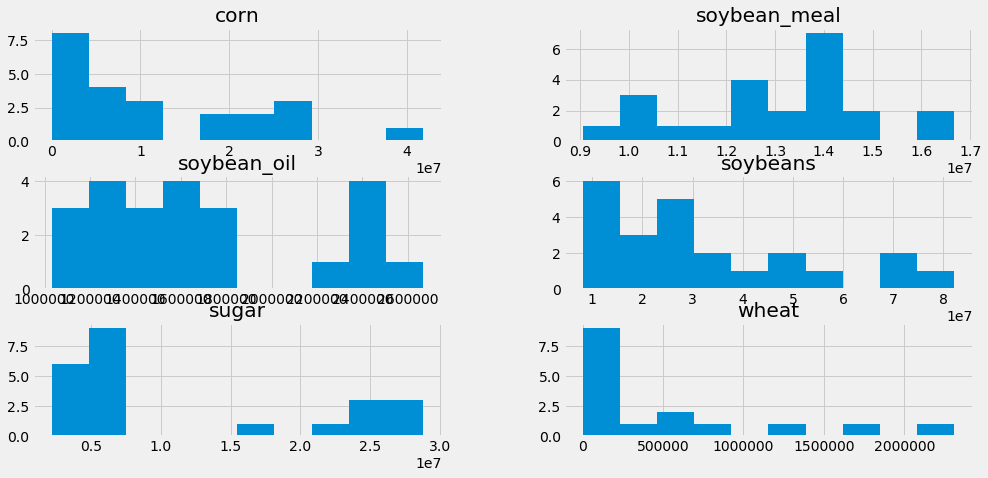

In [20]:
exports_t.hist();

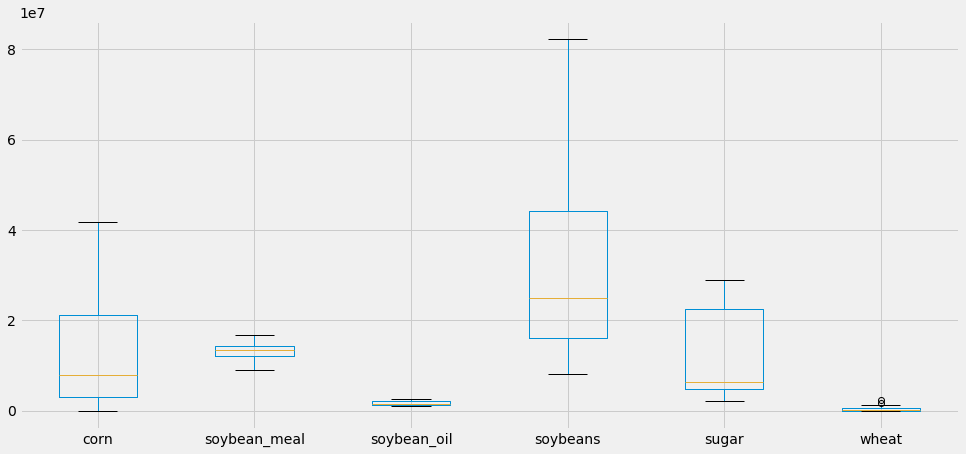

In [21]:
exports_t.boxplot();

In [22]:
exports_t.columns.to_list()

['corn', 'soybean_meal', 'soybean_oil', 'soybeans', 'sugar', 'wheat']

In [23]:
fig = px.box(exp, x='product', y='tons')
fig.show()

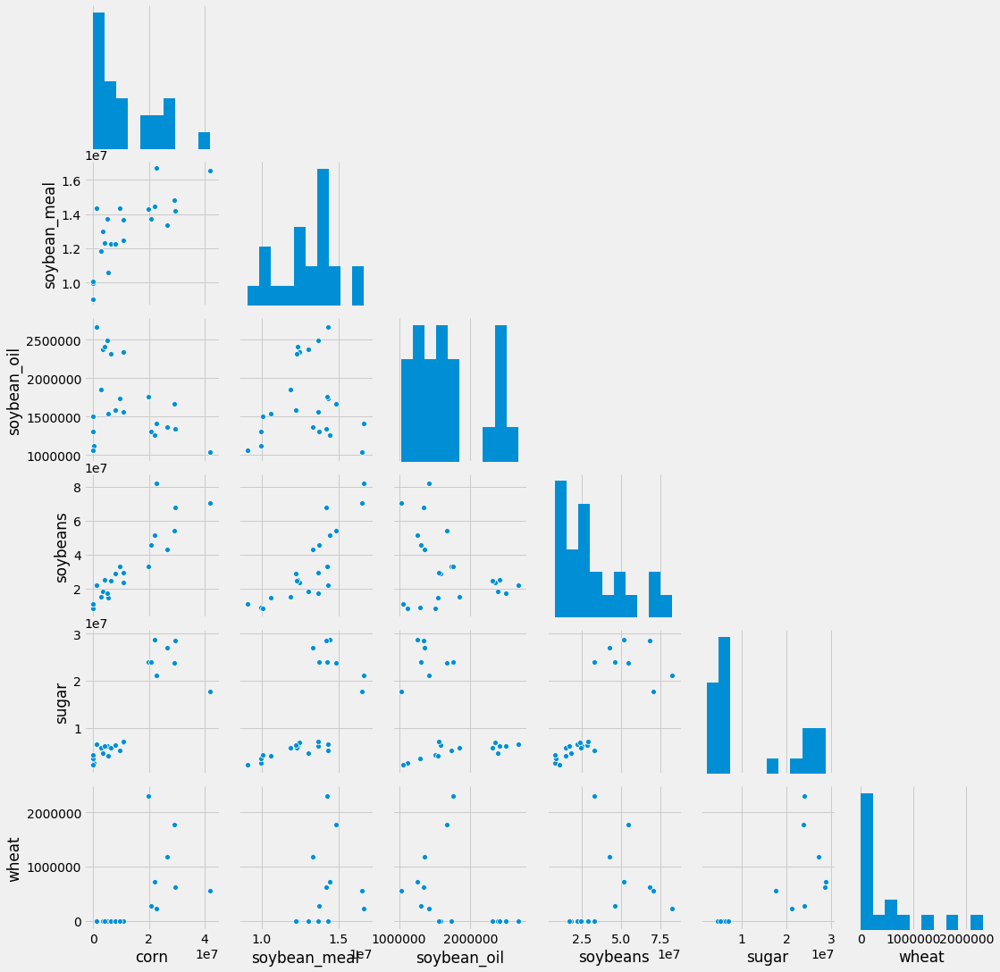

In [25]:
plt.rcParams['figure.figsize'] = (10,10)
sns.pairplot(exports_t, corner=True);

---

# 1Show the evolution of total monthly and total annual exports from Brazil (all states and to everywhere) of ‘soybeans’, ‘soybean oil’ and ‘soybean meal’;





* WHOLE THING MONTH AND YEAR FOR SOY

In [27]:
# TOTAL EXPORTS OF soy PRODUCTS BY YEAR IN TONS 
fig = px.line(exp_selec)

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [28]:

#all products exports year
exports_tm = exp.pivot_table(index=exp['date'],columns=pv,values='tons',aggfunc='sum')

#Filter by attributes
exp_selec_m = exports_tm[y]

# TOTAL EXPORTS OF soy PRODUCTS BY MONTH IN TONS 
fig = px.line(exp_selec_m)

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

# 2. What are the 3 most important products exported by Brazil in the last 5 years?

* TOP 3 PRODUCTS EXPORTED LAST 5 YEARS

In [29]:
exports_t.head()

product,corn,soybean_meal,soybean_oil,soybeans,sugar,wheat
date,,,,,,
1997,356895.029,9.965945e+06,1117451.178,8.195025e+06,2521669.683,NaN
1998,6033.643,9.947875e+06,1300080.071,8.679492e+06,3535547.848,NaN
1999,5321.076,1.005007e+07,1501525.634,8.096035e+06,4223416.423,NaN
2000,5554.756,9.055435e+06,1060952.727,1.072512e+07,2151825.035,NaN
2001,5410198.846,1.058249e+07,1540760.712,1.448690e+07,4071271.313,NaN


In [30]:
#get last occur
last_exp = exports_t.loc[exports_t.index > 2014]
last_exp

product,corn,soybean_meal,soybean_oil,soybeans,sugar,wheat
date,,,,,,
2015,2.890038e+07,1.482660e+07,1669874.182,5.430348e+07,2.380948e+07,1778870.494
2016,2.186444e+07,1.444379e+07,1253542.300,5.157381e+07,2.880695e+07,713326.228
2017,2.925533e+07,1.417674e+07,1342365.392,6.800659e+07,2.861423e+07,617664.418
2018,2.274727e+07,1.666998e+07,1414356.108,8.214744e+07,2.114488e+07,221278.511
2019,4.183192e+07,1.653038e+07,1031289.620,7.030014e+07,1.765812e+07,554696.613


In [31]:
# top products exports


x = ['corn', 'soybean_meal', 'soybean_oil', 'soybeans', 'sugar', 'wheat']
colors = ['lightslategray']

fig = go.Figure(go.Bar(x=x, y=last_exp.iloc[0,:],name='2015',marker_color=colors))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[1,:],name='2016'))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[2,:], name='2017'))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[3,:], name='2018'))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[4,:], name='2019'))

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, width=900, height=600)
fig.show()

##### What are the main routes through which Brazil have been exporting ‘corn’ in the last few years? 

# Are there differences in the relative importancem of routes depending on the product?

* MAIN ROUTES FOR CORN LAST YEARS

In [44]:
exp = df[df['type']=='Export']
r_exp = exp[exp['product']=='corn']
r_exp['year'] = r_exp['date'].dt.year
r_exp

/Users/rodrigomarques/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,product,state,country,type,route,tons,usd,year
2,1997-01-01,corn,GO,Bolivia,Export,Ground,0.200,180.0,1997
3,1997-01-01,corn,GO,United States,Export,Sea,3.488,5688.0,1997
5,1997-01-01,corn,MS,Paraguay,Export,Ground,40.000,38700.0,1997
9,1997-01-01,corn,PR,Netherlands,Export,Sea,170000.000,20000000.0,1997
10,1997-01-01,corn,PR,Paraguay,Export,Ground,258.300,386733.0,1997
...,...,...,...,...,...,...,...,...,...
117265,2019-12-01,corn,SP,Vietnam,Export,Sea,2575.793,402284.0,2019
117266,2019-12-01,corn,TO,Egypt,Export,Sea,27908.815,4433950.0,2019
117267,2019-12-01,corn,TO,Kuwait,Export,Sea,1293.930,229003.0,2019
117268,2019-12-01,corn,TO,Philippines,Export,Air,0.007,27.0,2019


In [45]:
#all products exports year
routes = r_exp.pivot_table(index= r_exp['year'],columns='route',values='tons',aggfunc='sum')
routes

route,Air,Ground,Other,River,Sea
year,,,,,
1997,36.600,6147.354,34.022,NaN,3.506771e+05
1998,21.810,3707.367,90.101,NaN,2.214365e+03
1999,39.773,4188.398,222.289,NaN,8.706160e+02
2000,30.433,4290.744,32.330,NaN,1.201249e+03
2001,11.920,2258.317,4.250,NaN,5.407924e+06
2002,40.859,5769.892,4.020,5983.080,2.715592e+06
2003,48.915,5942.550,NaN,20132.300,3.483612e+06
2004,53.708,7740.471,600.000,66026.972,4.817767e+06
2005,72.591,6605.544,0.125,NaN,1.062773e+06


In [48]:
#get last occur
last_exp = routes.loc[routes.index > 2016]
last_exp

route,Air,Ground,Other,River,Sea
year,,,,,
2017,236.327,11598.417,3407.038,1960313.569,2.727977e+07
2018,115.876,15282.257,60548.490,1461047.866,2.121027e+07
2019,64.060,21365.058,198480.924,78654.745,4.153336e+07


In [49]:
last_exp.columns

Index(['Air', 'Ground', 'Other', 'River', 'Sea'], dtype='object', name='route')

In [50]:
x = last_exp.columns
colors = ['lightslategray']

fig = go.Figure(go.Bar(x=x, y=last_exp.iloc[0,:],name='2017',marker_color=colors))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[1,:],name='2018'))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[2,:], name='2019'))

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, width=900, height=600)
fig.show()

In [51]:
top_routes = last_exp.sum(axis = 0, skipna = True)
top_routes.sort_values( inplace=True, ascending=False)
print('Top 3 routes', top_routes[:3])



Top 3 routes route
Sea      9.002341e+07
River    3.500016e+06
Other    2.624365e+05
dtype: float64


# Which countries have been the most important trade partners for Brazil in terms of ‘corn’ and ‘sugar’ in the last 3 years?

In [53]:
exp

,date,product,state,country,type,route,tons,usd
2,1997-01-01,corn,GO,Bolivia,Export,Ground,0.200,180.0
3,1997-01-01,corn,GO,United States,Export,Sea,3.488,5688.0
5,1997-01-01,corn,MS,Paraguay,Export,Ground,40.000,38700.0
9,1997-01-01,corn,PR,Netherlands,Export,Sea,170000.000,20000000.0
10,1997-01-01,corn,PR,Paraguay,Export,Ground,258.300,386733.0
...,...,...,...,...,...,...,...,...
117952,2019-12-01,wheat,PR,United States,Export,Sea,0.400,400.0
117957,2019-12-01,wheat,RS,Vietnam,Export,Sea,36698.000,6963002.0
117961,2019-12-01,wheat,SP,Ireland,Export,Sea,0.500,477.0
117963,2019-12-01,wheat,SP,Liberia,Export,Other,0.025,50.0


In [ ]:
c_exp = exp
c_exp = c_exp[c_exp['product']=='corn']
c_exp.append(c_exp['product']=='sugar')
c_exp['year'] = c_exp['date'].dt.year
c_exp

In [ ]:
#all products exports year
c = r_exp.pivot_table(index= r_exp['year'],columns='country',values='tons',aggfunc='sum')
c

In [ ]:
#get last occur
c = exports_t.loc[exports_t.index > 2016]
c

In [ ]:
x = last_exp.columns
colors = ['lightslategray']

fig = go.Figure(go.Bar(x=x, y=last_exp.iloc[0,:],name='2017',marker_color=colors))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[1,:],name='2018'))
fig.add_trace(go.Bar(x=x, y=last_exp.iloc[2,:], name='2019'))

fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, width=900, height=600)
fig.show()